In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud

In [2]:
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.patches as mpatches
from plotly.subplots import make_subplots
sns.set(color_codes = True)
sns.set(style="whitegrid")
import plotly.figure_factory as ff
from plotly.colors import n_colors
from matplotlib.collections import LineCollection
import matplotlib.mlab as mlab
import scipy as st
import statsmodels.api as sm
import statsmodels.formula.api as smf
from scipy.stats import ks_2samp
import time


In [3]:
%%time
 # to measure time we will use that
import warnings
warnings.filterwarnings('ignore')

Wall time: 0 ns


In [4]:
df = pd.read_csv(r"C:\Users\chlan\Desktop\New stuff\House_Prediction_Project\data.csv")
df.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,street,city,statezip,country
0,2014-05-02 00:00:00,313000.0,3.0,1.50,1340,7912,1.5,0,0,3,1340,0,1955,2005,18810 Densmore Ave N,Shoreline,WA 98133,USA
1,2014-05-02 00:00:00,2384000.0,5.0,2.50,3650,9050,2.0,0,4,5,3370,280,1921,0,709 W Blaine St,Seattle,WA 98119,USA
2,2014-05-02 00:00:00,342000.0,3.0,2.00,1930,11947,1.0,0,0,4,1930,0,1966,0,26206-26214 143rd Ave SE,Kent,WA 98042,USA
3,2014-05-02 00:00:00,420000.0,3.0,2.25,2000,8030,1.0,0,0,4,1000,1000,1963,0,857 170th Pl NE,Bellevue,WA 98008,USA
4,2014-05-02 00:00:00,550000.0,4.0,2.50,1940,10500,1.0,0,0,4,1140,800,1976,1992,9105 170th Ave NE,Redmond,WA 98052,USA


In [5]:
df.shape

(4600, 18)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4600 entries, 0 to 4599
Data columns (total 18 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   date           4600 non-null   object 
 1   price          4600 non-null   float64
 2   bedrooms       4600 non-null   float64
 3   bathrooms      4600 non-null   float64
 4   sqft_living    4600 non-null   int64  
 5   sqft_lot       4600 non-null   int64  
 6   floors         4600 non-null   float64
 7   waterfront     4600 non-null   int64  
 8   view           4600 non-null   int64  
 9   condition      4600 non-null   int64  
 10  sqft_above     4600 non-null   int64  
 11  sqft_basement  4600 non-null   int64  
 12  yr_built       4600 non-null   int64  
 13  yr_renovated   4600 non-null   int64  
 14  street         4600 non-null   object 
 15  city           4600 non-null   object 
 16  statezip       4600 non-null   object 
 17  country        4600 non-null   object 
dtypes: float

In [7]:
df.dtypes.value_counts()

int64      9
object     5
float64    4
dtype: int64

<AxesSubplot:ylabel='None'>

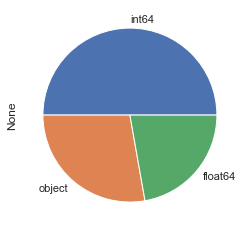

In [8]:
df.dtypes.value_counts().plot.pie()

In [9]:
df.describe(include = [np.number],percentiles=[.01, .02, .03, .05, .1, .5, .9, .92, .93, .99]).T

,count,mean,std,min,1%,2%,3%,5%,10%,50%,90%,92%,93%,99%,max
price,4600.0,551962.988473,563834.702547,0.0,0.00,142486.0,169955.00,200000.0,239950.0,460943.461539,900000.0,975000.00,1027210.00,2005220.00,26590000.0
bedrooms,4600.0,3.400870,0.908848,0.0,2.00,2.0,2.00,2.0,2.0,3.000000,4.0,5.00,5.00,6.00,9.0
bathrooms,4600.0,2.160815,0.783781,0.0,1.00,1.0,1.00,1.0,1.0,2.250000,3.0,3.25,3.25,4.50,8.0
sqft_living,4600.0,2139.346957,963.206916,370.0,720.00,800.0,860.00,950.0,1110.0,1980.000000,3340.0,3510.80,3640.70,5180.10,13540.0
sqft_lot,4600.0,14852.516087,35884.436145,638.0,1026.95,1200.0,1317.82,1690.8,3300.0,7683.000000,24301.8,32482.20,35724.10,203455.49,1074218.0
floors,4600.0,1.512065,0.538288,1.0,1.00,1.0,1.00,1.0,1.0,1.500000,2.0,2.00,2.00,3.00,3.5
waterfront,4600.0,0.007174,0.084404,0.0,0.00,0.0,0.00,0.0,0.0,0.000000,0.0,0.00,0.00,0.00,1.0
view,4600.0,0.240652,0.778405,0.0,0.00,0.0,0.00,0.0,0.0,0.000000,0.1,2.00,2.00,4.00,4.0
condition,4600.0,3.451739,0.677230,1.0,3.00,3.0,3.00,3.0,3.0,3.000000,4.0,5.00,5.00,5.00,5.0
sqft_above,4600.0,1827.265435,862.168977,370.0,709.90,760.0,800.00,860.0,970.0,1590.000000,3030.0,3160.00,3240.00,4460.10,9410.0


In [10]:
df.describe(include= [object]).T

,count,unique,top,freq
date,4600,70,2014-06-23 00:00:00,142
street,4600,4525,2520 Mulberry Walk NE,4
city,4600,44,Seattle,1573
statezip,4600,77,WA 98103,148
country,4600,1,USA,4600


In [11]:
df0 = df.copy()
df0.tail()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,street,city,statezip,country
4595,2014-07-09 00:00:00,308166.666667,3.0,1.75,1510,6360,1.0,0,0,4,1510,0,1954,1979,501 N 143rd St,Seattle,WA 98133,USA
4596,2014-07-09 00:00:00,534333.333333,3.0,2.50,1460,7573,2.0,0,0,3,1460,0,1983,2009,14855 SE 10th Pl,Bellevue,WA 98007,USA
4597,2014-07-09 00:00:00,416904.166667,3.0,2.50,3010,7014,2.0,0,0,3,3010,0,2009,0,759 Ilwaco Pl NE,Renton,WA 98059,USA
4598,2014-07-10 00:00:00,203400.000000,4.0,2.00,2090,6630,1.0,0,0,3,1070,1020,1974,0,5148 S Creston St,Seattle,WA 98178,USA
4599,2014-07-10 00:00:00,220600.000000,3.0,2.50,1490,8102,2.0,0,0,4,1490,0,1990,0,18717 SE 258th St,Covington,WA 98042,USA


In [12]:
(df0.isnull().sum()/df0.shape[0]).sort_values(ascending = False)

date             0.0
price            0.0
statezip         0.0
city             0.0
street           0.0
yr_renovated     0.0
yr_built         0.0
sqft_basement    0.0
sqft_above       0.0
condition        0.0
view             0.0
waterfront       0.0
floors           0.0
sqft_lot         0.0
sqft_living      0.0
bathrooms        0.0
bedrooms         0.0
country          0.0
dtype: float64

<AxesSubplot:>

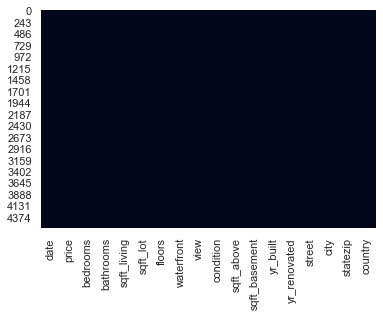

In [13]:
sns.heatmap(df0.isna(),cbar=False)

In [14]:
df0.shape

(4600, 18)

In [15]:
df0.drop_duplicates()
df0.shape

(4600, 18)

In [16]:
df0.drop(columns=['date'],inplace = True)

In [17]:
df0.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,street,city,statezip,country
0,313000.0,3.0,1.50,1340,7912,1.5,0,0,3,1340,0,1955,2005,18810 Densmore Ave N,Shoreline,WA 98133,USA
1,2384000.0,5.0,2.50,3650,9050,2.0,0,4,5,3370,280,1921,0,709 W Blaine St,Seattle,WA 98119,USA
2,342000.0,3.0,2.00,1930,11947,1.0,0,0,4,1930,0,1966,0,26206-26214 143rd Ave SE,Kent,WA 98042,USA
3,420000.0,3.0,2.25,2000,8030,1.0,0,0,4,1000,1000,1963,0,857 170th Pl NE,Bellevue,WA 98008,USA
4,550000.0,4.0,2.50,1940,10500,1.0,0,0,4,1140,800,1976,1992,9105 170th Ave NE,Redmond,WA 98052,USA


In [18]:
df0.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,street,city,statezip,country
0,313000.0,3.0,1.50,1340,7912,1.5,0,0,3,1340,0,1955,2005,18810 Densmore Ave N,Shoreline,WA 98133,USA
1,2384000.0,5.0,2.50,3650,9050,2.0,0,4,5,3370,280,1921,0,709 W Blaine St,Seattle,WA 98119,USA
2,342000.0,3.0,2.00,1930,11947,1.0,0,0,4,1930,0,1966,0,26206-26214 143rd Ave SE,Kent,WA 98042,USA
3,420000.0,3.0,2.25,2000,8030,1.0,0,0,4,1000,1000,1963,0,857 170th Pl NE,Bellevue,WA 98008,USA
4,550000.0,4.0,2.50,1940,10500,1.0,0,0,4,1140,800,1976,1992,9105 170th Ave NE,Redmond,WA 98052,USA


In [19]:
for i in df0.columns:
    if df0[i].dtypes == 'O':
        print(i)
        print(len(df0[i].unique()))
        print(df0[i].unique())
        print()

street
4525
['18810 Densmore Ave N' '709 W Blaine St' '26206-26214 143rd Ave SE' ...
 '759 Ilwaco Pl NE' '5148 S Creston St' '18717 SE 258th St']

city
44
['Shoreline' 'Seattle' 'Kent' 'Bellevue' 'Redmond' 'Maple Valley'
 'North Bend' 'Lake Forest Park' 'Sammamish' 'Auburn' 'Des Moines'
 'Bothell' 'Federal Way' 'Kirkland' 'Issaquah' 'Woodinville'
 'Normandy Park' 'Fall City' 'Renton' 'Carnation' 'Snoqualmie' 'Duvall'
 'Burien' 'Covington' 'Inglewood-Finn Hill' 'Kenmore' 'Newcastle'
 'Mercer Island' 'Black Diamond' 'Ravensdale' 'Clyde Hill' 'Algona'
 'Skykomish' 'Tukwila' 'Vashon' 'Yarrow Point' 'SeaTac' 'Medina'
 'Enumclaw' 'Snoqualmie Pass' 'Pacific' 'Beaux Arts Village' 'Preston'
 'Milton']

statezip
77
['WA 98133' 'WA 98119' 'WA 98042' 'WA 98008' 'WA 98052' 'WA 98115'
 'WA 98038' 'WA 98045' 'WA 98155' 'WA 98105' 'WA 98074' 'WA 98106'
 'WA 98007' 'WA 98092' 'WA 98198' 'WA 98006' 'WA 98102' 'WA 98011'
 'WA 98125' 'WA 98003' 'WA 98136' 'WA 98033' 'WA 98029' 'WA 98117'
 'WA 98034' 'WA 9

In [20]:
df0.drop(columns=['street','country'],inplace=True)

In [21]:
df0.head(1)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,city,statezip
0,313000.0,3.0,1.5,1340,7912,1.5,0,0,3,1340,0,1955,2005,Shoreline,WA 98133


In [22]:
df0.dtypes.values

array([dtype('float64'), dtype('float64'), dtype('float64'),
       dtype('int64'), dtype('int64'), dtype('float64'), dtype('int64'),
       dtype('int64'), dtype('int64'), dtype('int64'), dtype('int64'),
       dtype('int64'), dtype('int64'), dtype('O'), dtype('O')],
      dtype=object)

In [23]:
num_cols = []
cat_cols = []
for i in df0.columns:
    if df0[i].dtypes == 'O':
        cat_cols.append(i)
    else:
        num_cols.append(i)

In [24]:
for i in num_cols:
    df0[i]=df0[i].astype(float)

In [25]:
df0.dtypes.unique()

array([dtype('float64'), dtype('O')], dtype=object)

In [26]:
def distrib_normalize(data, i):
    """Fonction qui trace la distribution d'une variable et qui calcule la symétrie, 
    le coefficient d'applatissement et le respect à une loi statistique : ici la loi normale
    
    Entrée : 
    - Nom du dataframe
    - Colonne d'une variable
    
    Sortie : 
    - Graphique de distribution
    - Résultat de la symétrie
    - Résultat du coefficient d'applatissement
    - Résultat à l'adéquation à la loi normale
  """
    print(i.capitalize())
    sns.displot(data[i], kde=True)
    plt.axvline(x=data[i].mean(), label='Moyenne', linestyle='-', color='r', linewidth=2)
    plt.axvline(x=data[i].median(), label='Médiane', linestyle='--', color='g', linewidth=2)
    plt.legend()
    plt.show()
    print('Skewness: ', str(st.stats.skew(data[i])))
    print('Kurtosis: ', str(st.stats.kurtosis(data[i])))
    print(str(ks_2samp(data[i],list(np.random.normal(np.mean(data[i]), np.std(data[i]), 1000)))))
    print()

In [27]:
df0.columns

Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'sqft_above', 'sqft_basement',
       'yr_built', 'yr_renovated', 'city', 'statezip'],
      dtype='object')

Sqft_living


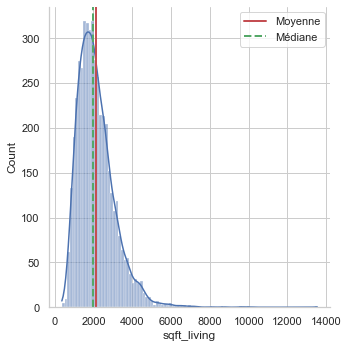

Skewness:  1.722951204510254
Kurtosis:  8.281368579388143
KstestResult(statistic=0.07382608695652174, pvalue=0.00024373365264818148)

Sqft_lot


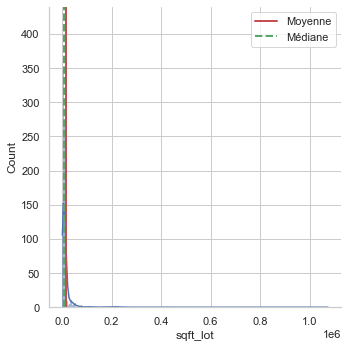

Skewness:  11.303451304292855
Kurtosis:  219.6327636941993
KstestResult(statistic=0.3373913043478261, pvalue=1.4432899320127035e-15)

Sqft_above


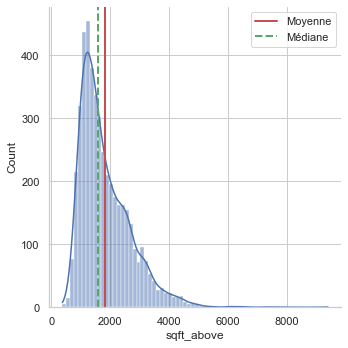

Skewness:  1.4937234612067187
Kurtosis:  4.064411483299023
KstestResult(statistic=0.13060869565217392, pvalue=1.1294298829511717e-12)

Yr_built


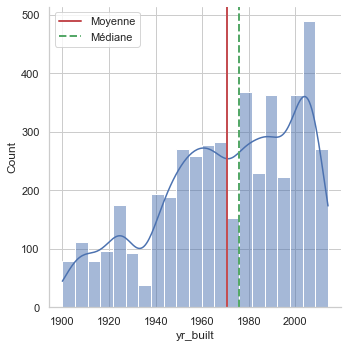

Skewness:  -0.5019914288959365
Kurtosis:  -0.670651842997954
KstestResult(statistic=0.08465217391304347, pvalue=1.4351445482008174e-05)



In [28]:
for col in ['sqft_living','sqft_lot','sqft_above','yr_built']:
    distrib_normalize(df0,col)

In [29]:
fig = px.histogram(df0, x="price",
                   marginal="box", # or violin, rug
                   hover_data=df0.columns)
fig.show()

In [30]:
df0 = df0[(
                (df0['price'] <= 1000000) & 
                (df0['price'] > 150000) & 
                (df0['bathrooms'] <= 6) & 
                (df0['condition'] > 2) & 
                (df0['sqft_living'] > 800) & 
                (df0['bedrooms'] >= 1) & 
                (df0['bedrooms'] <= 4.5) 
                )]

In [31]:
df0 = df0[df0['price']!=0]

In [32]:
fig = px.histogram(df0, x="price",
                   marginal="box", # or violin, rug
                   hover_data=df0.columns)
fig.show()

In [33]:
import matplotlib.style as style
import matplotlib.gridspec as gridspec
from scipy import stats

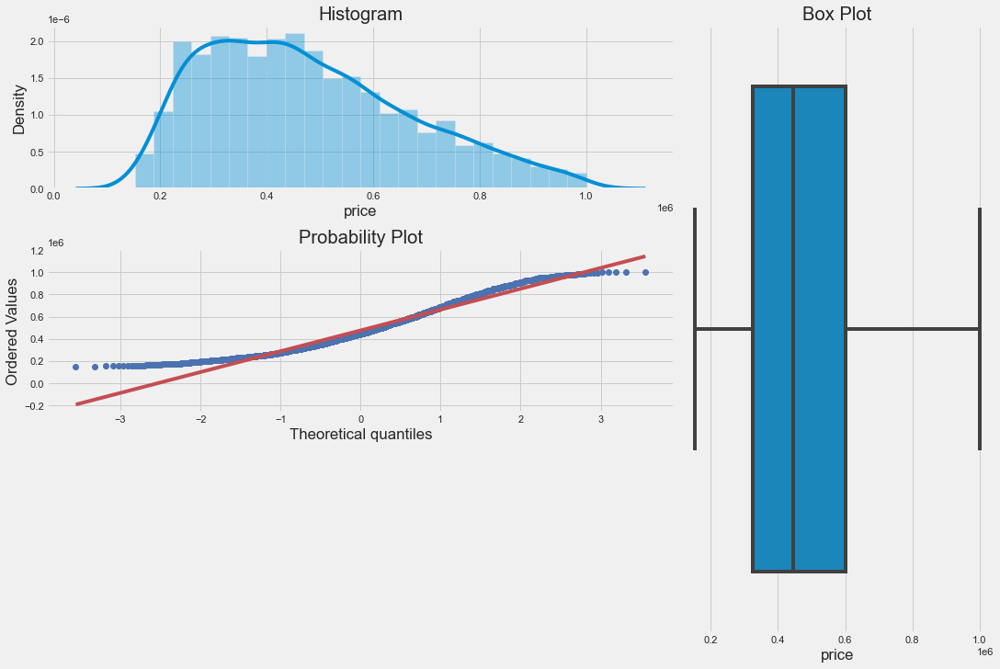

In [34]:
def plotting_3_chart(df, feature):
    ## Importing seaborn, matplotlab and scipy modules. 
    style.use('fivethirtyeight')

    ## Creating a customized chart. and giving in figsize and everything. 
    fig = plt.figure(constrained_layout=True, figsize=(15,10))
    ## creating a grid of 3 cols and 3 rows. 
    grid = gridspec.GridSpec(ncols=3, nrows=3, figure=fig)
    
    ## Customizing the histogram grid. 
    ax1 = fig.add_subplot(grid[0, :2])
    ## Set the title. 
    ax1.set_title('Histogram')
    ## plot the histogram. 
    sns.distplot(df.loc[:,feature], norm_hist=True, ax = ax1)

    # customizing the QQ_plot. 
    ax2 = fig.add_subplot(grid[1, :2])
    ## Set the title. 
    ax2.set_title('QQ_plot')
    ## Plotting the QQ_Plot. 
    stats.probplot(df.loc[:,feature], plot = ax2)

    ## Customizing the Box Plot. 
    ax3 = fig.add_subplot(grid[:, 2])
    ## Set title. 
    ax3.set_title('Box Plot')
    ## Plotting the box plot. 
    sns.boxplot(df.loc[:,feature], orient='v', ax = ax3 );
    
plotting_3_chart(df0, 'price')

In [35]:
df0.columns

Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'sqft_above', 'sqft_basement',
       'yr_built', 'yr_renovated', 'city', 'statezip'],
      dtype='object')

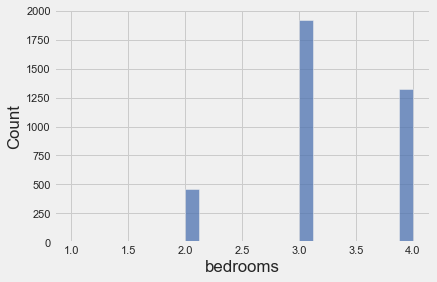

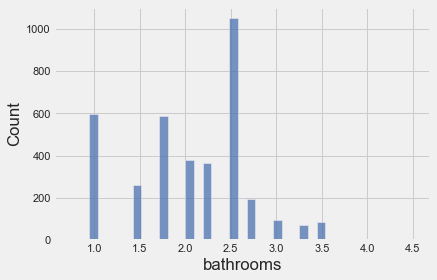

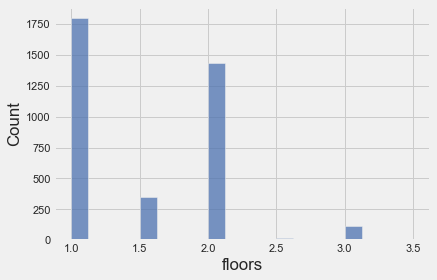

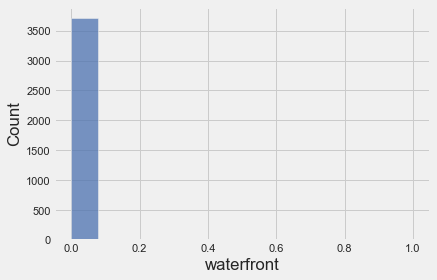

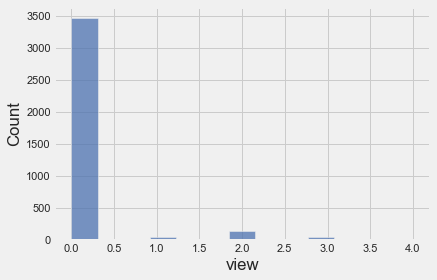

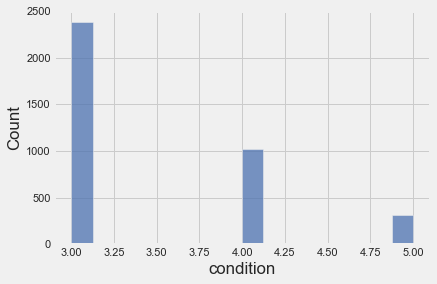

In [36]:
for col in ['bedrooms','bathrooms','floors','waterfront','view','condition']:
    plt.figure()
    sns.histplot(data=df0, x=col)

In [37]:
df0.columns

Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'sqft_above', 'sqft_basement',
       'yr_built', 'yr_renovated', 'city', 'statezip'],
      dtype='object')

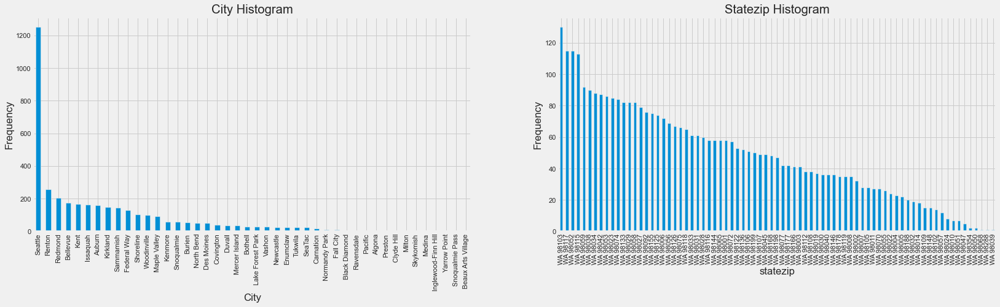

In [38]:
plt.figure(figsize=(25, 6))

plt.subplot(1,2,1)
plt1 = df0.city.value_counts().plot(kind='bar')
plt.title('City Histogram')
plt1.set(xlabel = 'City', ylabel='Frequency')

plt.subplot(1,2,2)
plt1 = df0.statezip.value_counts().plot(kind='bar')
plt.title('Statezip Histogram')
plt1.set(xlabel = 'statezip', ylabel='Frequency')

plt.show()

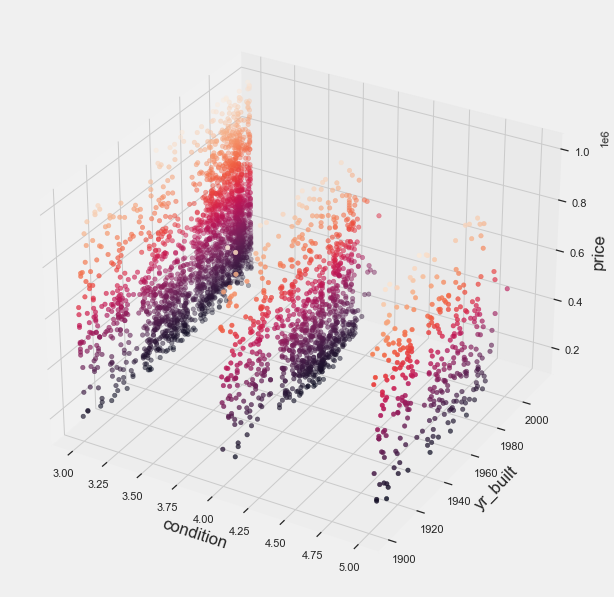

In [39]:
fig = plt.figure(figsize=(10,10))
ax = plt.axes(projection="3d")

z_points = df0['price']
x_points = df0['condition']
y_points = df0['yr_built']
ax.scatter3D(x_points, y_points, z_points, c=z_points);

ax.set_xlabel('condition')
ax.set_ylabel('yr_built')
ax.set_zlabel('price')

plt.show()

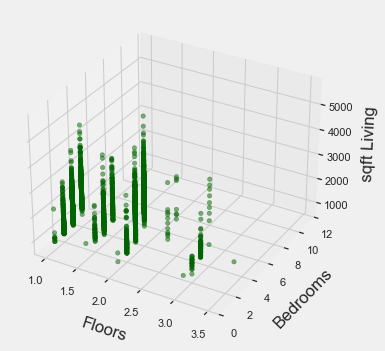

In [40]:
fig=plt.figure(figsize=(19,12.5))
ax=fig.add_subplot(2,2,2, projection="3d")
ax.scatter(df0['floors'],df0['bedrooms'],df0['sqft_living'],c="darkgreen",alpha=.5)
ax.set(xlabel='\nFloors',ylabel='\nBedrooms',zlabel='\nsqft Living')
ax.set(ylim=[0,12])
plt.show()

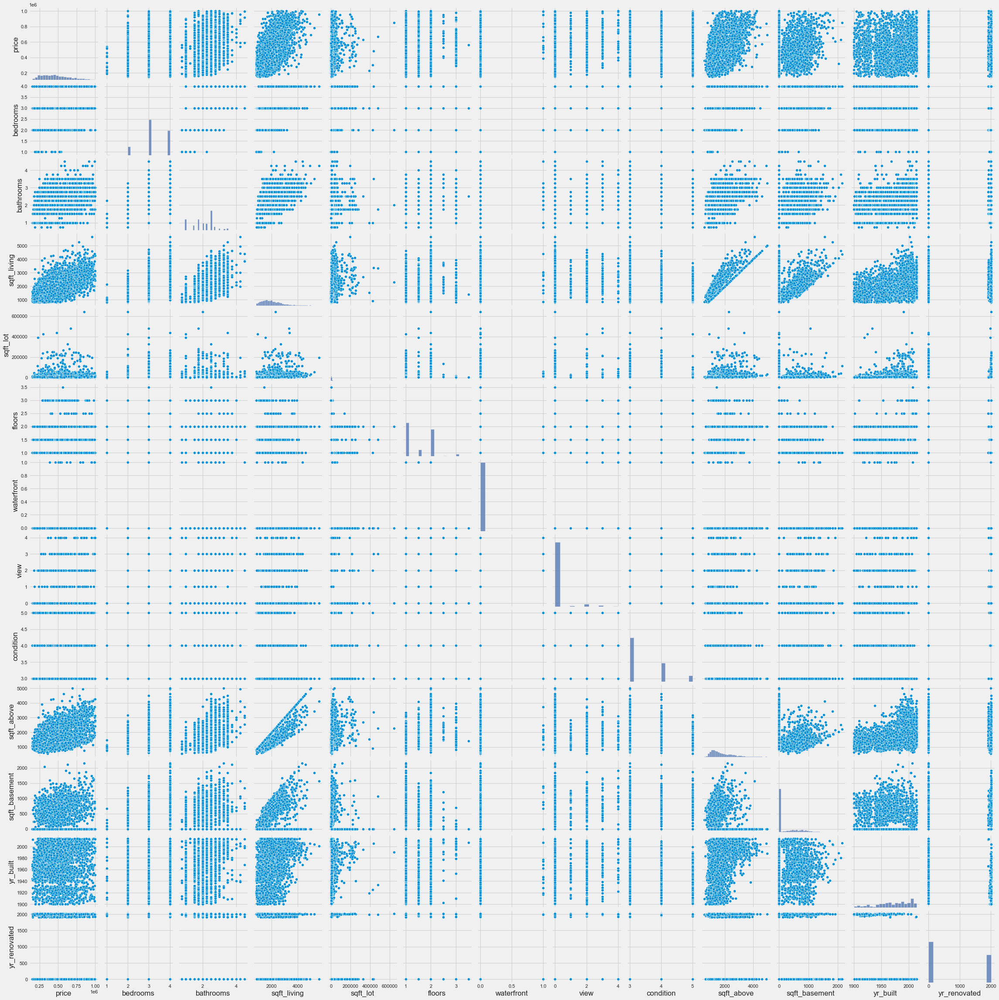

In [41]:
sns.pairplot(df0[num_cols])

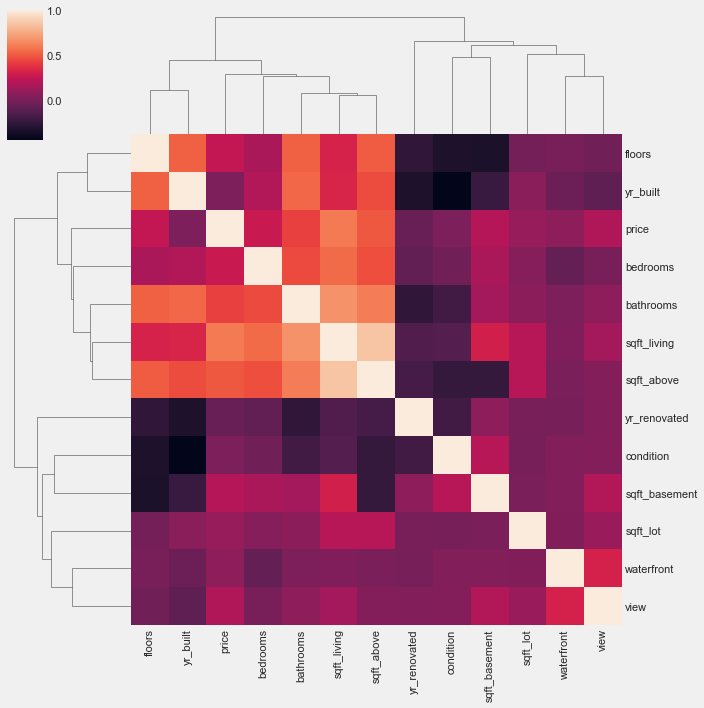

In [42]:
sns.clustermap(df0[num_cols].corr())

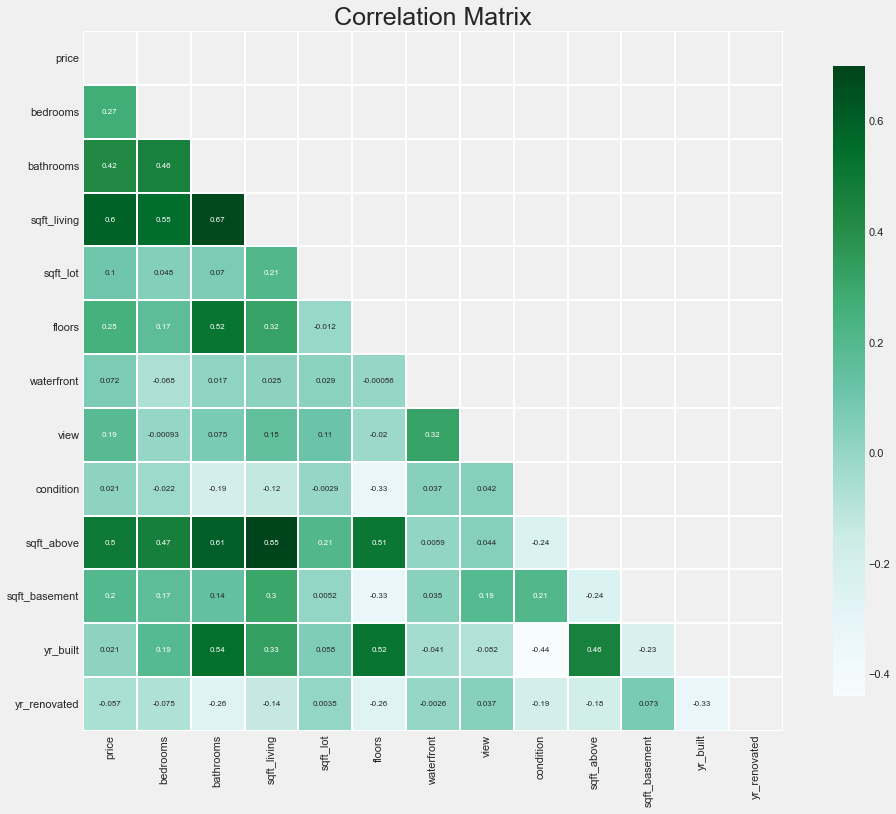

In [43]:
features = df0.columns.values.tolist()
mask = np.zeros_like(df0[features].corr(), dtype=np.bool) 
mask[np.triu_indices_from(mask)] = True 

f, ax = plt.subplots(figsize=(16, 12))
plt.title('Correlation Matrix',fontsize=25)

sns.heatmap(df0[features].corr(),linewidths=0.25,vmax=0.7,square=True,cmap="BuGn", #"BuGn_r" to reverse 
            linecolor='w',annot=True,annot_kws={"size":8},mask=mask,cbar_kws={"shrink": .9});

In [44]:
df0.head(3)

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,city,statezip
0,313000.0,3.0,1.50,1340.0,7912.0,1.5,0.0,0.0,3.0,1340.0,0.0,1955.0,2005.0,Shoreline,WA 98133
2,342000.0,3.0,2.00,1930.0,11947.0,1.0,0.0,0.0,4.0,1930.0,0.0,1966.0,0.0,Kent,WA 98042
3,420000.0,3.0,2.25,2000.0,8030.0,1.0,0.0,0.0,4.0,1000.0,1000.0,1963.0,0.0,Bellevue,WA 98008


In [45]:
def prices_dist_feat(feature):
    DF = pd.DataFrame(df0.groupby([feature])['price'].mean().sort_values(ascending = False))
    DF.plot.bar(figsize=(8,6))
    plt.title(feature +' vs Average Price')
    plt.show()

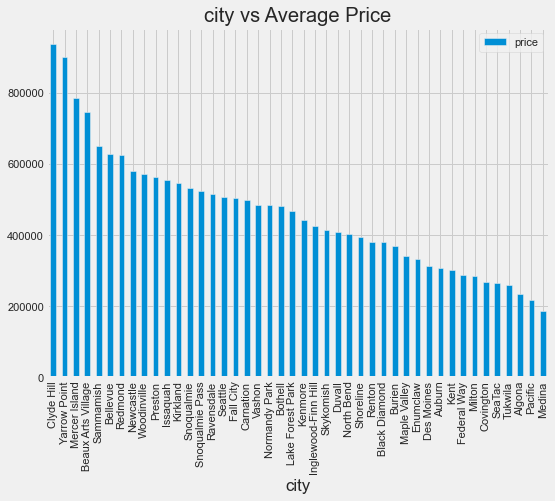

In [46]:
prices_dist_feat('city')

In [47]:
df0.groupby(['statezip'])['price'].mean().sort_values(ascending = False)

statezip
WA 98040    784834.055556
WA 98004    784733.913043
WA 98005    696502.969697
WA 98119    696437.142857
WA 98075    695503.191460
                ...      
WA 98032    263852.210526
WA 98168    240504.069444
WA 98002    231256.343750
WA 98047    218280.000000
WA 98039    188000.000000
Name: price, Length: 77, dtype: float64

In [48]:
DF = pd.DataFrame(df0.groupby(['statezip'])['price'].mean().sort_values(ascending = False),index=None)
DF['statezip']=DF.index
new_index = np.arange(0,DF.shape[0])
DF.set_index(new_index,inplace=True)
DF.head()

,price,statezip
0,784834.055556,WA 98040
1,784733.913043,WA 98004
2,696502.969697,WA 98005
3,696437.142857,WA 98119
4,695503.191460,WA 98075


In [49]:
fig = px.histogram(DF, x="statezip",y="price")
fig.show()

In [50]:
df0.drop(columns=['statezip'],inplace=True)

In [51]:
df0.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_renovated,city
0,313000.0,3.0,1.50,1340.0,7912.0,1.5,0.0,0.0,3.0,1340.0,0.0,1955.0,2005.0,Shoreline
2,342000.0,3.0,2.00,1930.0,11947.0,1.0,0.0,0.0,4.0,1930.0,0.0,1966.0,0.0,Kent
3,420000.0,3.0,2.25,2000.0,8030.0,1.0,0.0,0.0,4.0,1000.0,1000.0,1963.0,0.0,Bellevue
4,550000.0,4.0,2.50,1940.0,10500.0,1.0,0.0,0.0,4.0,1140.0,800.0,1976.0,1992.0,Redmond
5,490000.0,2.0,1.00,880.0,6380.0,1.0,0.0,0.0,3.0,880.0,0.0,1938.0,1994.0,Seattle


In [52]:
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder
from sklearn.preprocessing import MinMaxScaler, StandardScaler

In [53]:
def encode_withDummies(df,column_name):
   temp = pd.get_dummies(df[column_name], drop_first = True)
   df = pd.concat([df, temp], axis = 1)
   df.drop([column_name], axis = 1, inplace = True)
   return df

In [54]:
df0 = encode_withDummies(df0,'city')

In [55]:
df0.isna().sum()

price                  0
bedrooms               0
bathrooms              0
sqft_living            0
sqft_lot               0
floors                 0
waterfront             0
view                   0
condition              0
sqft_above             0
sqft_basement          0
yr_built               0
yr_renovated           0
Auburn                 0
Beaux Arts Village     0
Bellevue               0
Black Diamond          0
Bothell                0
Burien                 0
Carnation              0
Clyde Hill             0
Covington              0
Des Moines             0
Duvall                 0
Enumclaw               0
Fall City              0
Federal Way            0
Inglewood-Finn Hill    0
Issaquah               0
Kenmore                0
Kent                   0
Kirkland               0
Lake Forest Park       0
Maple Valley           0
Medina                 0
Mercer Island          0
Milton                 0
Newcastle              0
Normandy Park          0
North Bend             0


In [56]:
df0.shape

(3720, 56)

In [57]:
from sklearn.model_selection import train_test_split

np.random.seed(0)
df_train, df_test = train_test_split(df0, train_size = 0.7, test_size = 0.3, random_state = 100)

In [58]:
print(df_train.shape)
print(df_test.shape)

(2604, 56)
(1116, 56)


In [59]:
df0.columns

Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'sqft_above', 'sqft_basement',
       'yr_built', 'yr_renovated', 'Auburn', 'Beaux Arts Village', 'Bellevue',
       'Black Diamond', 'Bothell', 'Burien', 'Carnation', 'Clyde Hill',
       'Covington', 'Des Moines', 'Duvall', 'Enumclaw', 'Fall City',
       'Federal Way', 'Inglewood-Finn Hill', 'Issaquah', 'Kenmore', 'Kent',
       'Kirkland', 'Lake Forest Park', 'Maple Valley', 'Medina',
       'Mercer Island', 'Milton', 'Newcastle', 'Normandy Park', 'North Bend',
       'Pacific', 'Preston', 'Ravensdale', 'Redmond', 'Renton', 'Sammamish',
       'SeaTac', 'Seattle', 'Shoreline', 'Skykomish', 'Snoqualmie',
       'Snoqualmie Pass', 'Tukwila', 'Vashon', 'Woodinville', 'Yarrow Point'],
      dtype='object')

In [60]:
scaler = StandardScaler()
enc_num_col=[]
for col in num_cols:
    if col != 'price':
        enc_num_col.append(col)
print(enc_num_col)
df_train[enc_num_col]=scaler.fit_transform(df_train[enc_num_col])
df_test[enc_num_col]=scaler.fit_transform(df_test[enc_num_col])

['bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated']


In [61]:
df_train.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,...,SeaTac,Seattle,Shoreline,Skykomish,Snoqualmie,Snoqualmie Pass,Tukwila,Vashon,Woodinville,Yarrow Point
3020,442900.0,1.149061,-0.487458,-0.276823,-0.347849,-0.920963,-0.065132,-0.253823,0.849496,-1.183468,...,0,1,0,0,0,0,0,0,0,0
1201,353250.0,-1.825248,-1.635491,-1.286259,-0.384121,0.902754,-0.065132,-0.253823,-0.681361,-0.940419,...,0,1,0,0,0,0,0,0,0,0
2804,650000.0,-0.338093,-0.870136,-0.921740,-0.185235,-0.920963,-0.065132,-0.253823,-0.681361,-0.568697,...,0,0,0,0,0,0,0,0,0,0
3489,695000.0,-0.338093,1.043252,0.858793,-0.064664,0.902754,-0.065132,-0.253823,-0.681361,1.247023,...,0,0,0,0,0,0,0,0,0,0
582,717000.0,-0.338093,-0.870136,-0.935760,-0.314508,-0.920963,-0.065132,-0.253823,-0.681361,-0.897528,...,0,1,0,0,0,0,0,0,0,0


In [62]:
df_train.describe()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,...,SeaTac,Seattle,Shoreline,Skykomish,Snoqualmie,Snoqualmie Pass,Tukwila,Vashon,Woodinville,Yarrow Point
count,2604.000000,2.604000e+03,2.604000e+03,2.604000e+03,2.604000e+03,2.604000e+03,2.604000e+03,2.604000e+03,2.604000e+03,2.604000e+03,...,2604.000000,2604.000000,2604.000000,2604.000000,2604.000000,2604.000000,2604.000000,2604.000000,2604.000000,2604.0
mean,480891.039645,-1.337043e-16,3.274390e-17,1.173323e-16,-1.910061e-17,1.125572e-16,-8.185976e-18,-2.660442e-17,-8.049543e-17,-1.091463e-17,...,0.006528,0.339094,0.024962,0.000384,0.015361,0.000384,0.006912,0.008065,0.026498,0.0
std,192293.512617,1.000192e+00,1.000192e+00,1.000192e+00,1.000192e+00,1.000192e+00,1.000192e+00,1.000192e+00,1.000192e+00,1.000192e+00,...,0.080550,0.473493,0.156038,0.019597,0.123007,0.019597,0.082869,0.089457,0.160641,0.0
min,152000.000000,-3.312402e+00,-2.018168e+00,-1.636757e+00,-4.134928e-01,-9.209634e-01,-6.513210e-02,-2.538226e-01,-6.813608e-01,-1.669566e+00,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
25%,329950.000000,-3.380935e-01,-4.874583e-01,-7.535009e-01,-2.818768e-01,-9.209634e-01,-6.513210e-02,-2.538226e-01,-6.813608e-01,-7.688550e-01,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
50%,449725.000000,-3.380935e-01,2.778968e-01,-1.226034e-01,-2.072793e-01,-9.104581e-03,-6.513210e-02,-2.538226e-01,-6.813608e-01,-2.684598e-01,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
75%,600000.000000,1.149061e+00,6.605743e-01,6.204535e-01,-1.204461e-01,9.027543e-01,-6.513210e-02,-2.538226e-01,8.494965e-01,5.643408e-01,...,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0
max,1000000.000000,1.149061e+00,3.721994e+00,5.162915e+00,1.914427e+01,3.638331e+00,1.535341e+01,6.242040e+00,2.380354e+00,4.592522e+00,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.0


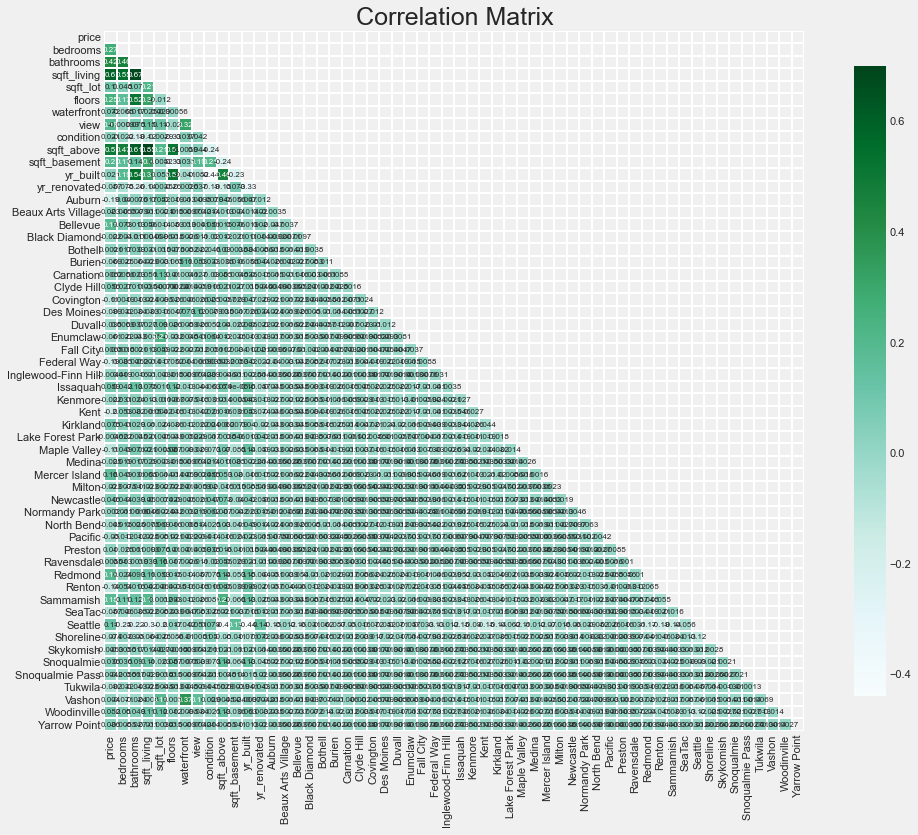

In [63]:
features = df0.columns.values.tolist()
mask = np.zeros_like(df0[features].corr(), dtype=np.bool) 
mask[np.triu_indices_from(mask)] = True 

f, ax = plt.subplots(figsize=(16, 12))
plt.title('Correlation Matrix',fontsize=25)

sns.heatmap(df0[features].corr(),linewidths=0.25,vmax=0.7,square=True,cmap="BuGn", #"BuGn_r" to reverse 
            linecolor='w',annot=True,annot_kws={"size":8},mask=mask,cbar_kws={"shrink": .9});

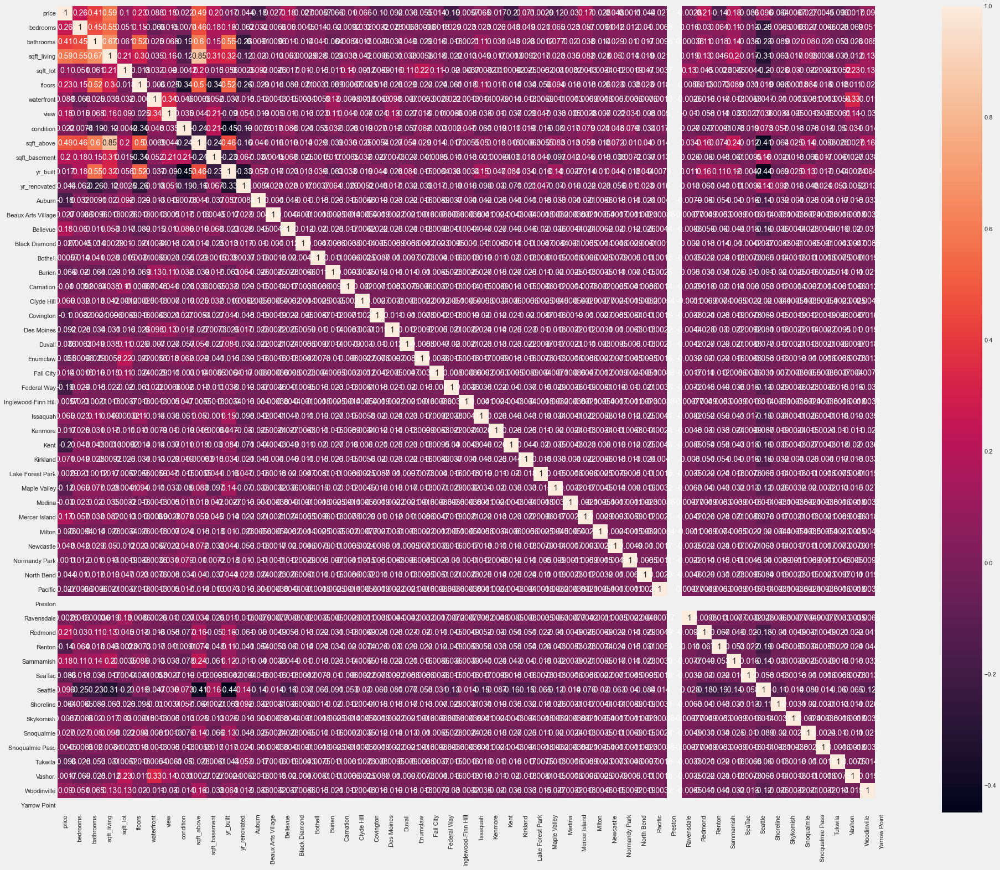

In [64]:
#Correlation using heatmap
plt.figure(figsize = (30, 25))
sns.heatmap(df_train.corr(), annot = True)
plt.show()

In [65]:
cols = df0.columns


columns are Index(['price', 'sqft_living', 'sqft_above', 'bathrooms', 'bedrooms', 'floors',
       'Redmond', 'sqft_basement', 'Sammamish', 'view', 'Bellevue',
       'Mercer Island', 'sqft_lot', 'Seattle', 'Woodinville'],
      dtype='object')



<AxesSubplot:>

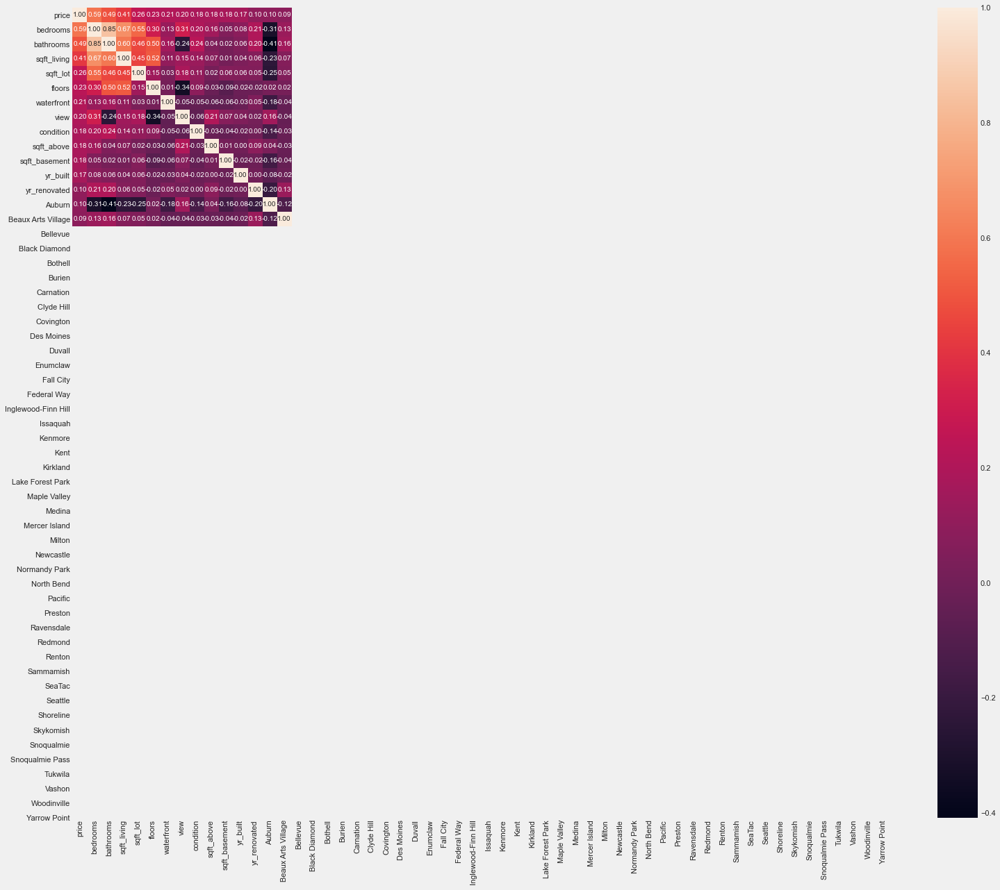

In [66]:
plt.figure(figsize=(25,20))
k=15
#print(df0.corr())
c = df_train.corr().nlargest(k,'price')['price'].index
print(f'\ncolumns are {c}\n')
cm = np.corrcoef(df_train[c].values.T)
#print(cm)
sns.heatmap(cm,cbar=True,annot=True,square=True,fmt='.2f',annot_kws={'size': 10},xticklabels=cols.values,yticklabels=cols.values)

In [67]:
y_train = df_train.pop('price')
X_train = df_train
y_test = df_test.pop('price')
X_test = df_test

In [68]:
X_train

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,...,SeaTac,Seattle,Shoreline,Skykomish,Snoqualmie,Snoqualmie Pass,Tukwila,Vashon,Woodinville,Yarrow Point
3020,1.149061,-0.487458,-0.276823,-0.347849,-0.920963,-0.065132,-0.253823,0.849496,-1.183468,1.614586,...,0,1,0,0,0,0,0,0,0,0
1201,-1.825248,-1.635491,-1.286259,-0.384121,0.902754,-0.065132,-0.253823,-0.681361,-0.940419,-0.665164,...,0,1,0,0,0,0,0,0,0,0
2804,-0.338093,-0.870136,-0.921740,-0.185235,-0.920963,-0.065132,-0.253823,-0.681361,-0.568697,-0.665164,...,0,0,0,0,0,0,0,0,0,0
3489,-0.338093,1.043252,0.858793,-0.064664,0.902754,-0.065132,-0.253823,-0.681361,1.247023,-0.665164,...,0,0,0,0,0,0,0,0,0,0
582,-0.338093,-0.870136,-0.935760,-0.314508,-0.920963,-0.065132,-0.253823,-0.681361,-0.897528,-0.101630,...,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2342,-0.338093,-0.487458,0.634473,0.013009,-0.920963,-0.065132,1.370143,-0.681361,-0.697370,2.408657,...,0,0,0,0,0,0,0,0,0,0
88,-1.825248,1.425929,-0.795561,-0.395113,0.902754,-0.065132,-0.253823,-0.681361,-0.826043,0.026445,...,0,1,0,0,0,0,0,0,0,0
2249,1.149061,1.043252,-0.052504,-0.232835,0.902754,-0.065132,-0.253823,-0.681361,0.317717,-0.665164,...,0,0,0,0,0,0,0,0,0,0
3448,1.149061,-0.487458,0.185835,7.679884,-0.920963,-0.065132,-0.253823,0.849496,0.560767,-0.665164,...,0,0,0,0,0,0,0,0,0,0


In [69]:
import pandas_profiling as pp
# models
from sklearn.linear_model import LinearRegression,LogisticRegression, SGDRegressor, RidgeCV
from sklearn.svm import SVR, LinearSVR
from sklearn.ensemble import RandomForestRegressor
import sklearn.model_selection
from sklearn.model_selection import cross_val_predict as cvp
from sklearn import metrics
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder, StandardScaler
from scipy.stats import pearsonr

import xgboost as xgb
import lightgbm as lgb

# model tuning
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe, space_eval

In [70]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
from sklearn.metrics import mean_squared_error,mean_absolute_error
from sklearn.metrics import r2_score 

In [71]:
rf = RandomForestRegressor()

In [72]:
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1200, num = 12)]
max_features = ['auto', 'sqrt']
max_depth = [int(x) for x in np.linspace(5, 30, num = 6)]
min_samples_split = [2, 5, 10, 15, 100]
min_samples_leaf = [1, 2, 5, 10]

In [73]:
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf}

print(random_grid)

{'n_estimators': [100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200], 'max_features': ['auto', 'sqrt'], 'max_depth': [5, 10, 15, 20, 25, 30], 'min_samples_split': [2, 5, 10, 15, 100], 'min_samples_leaf': [1, 2, 5, 10]}


In [74]:
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid,scoring='neg_mean_squared_error', n_iter = 10, cv = 5, verbose=2, random_state=42, n_jobs = 1)

In [75]:
rf_random.fit(X_train,y_train)

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time=   1.7s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time=   1.7s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time=   2.0s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time=   2.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=5, min_samples_split=5, n_estimators=900; total time=   2.0s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1100; total time=   2.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=1100; total time=   2.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimator

RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(), n_jobs=1,
                   param_distributions={'max_depth': [5, 10, 15, 20, 25, 30],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 5, 10],
                                        'min_samples_split': [2, 5, 10, 15,
                                                              100],
                                        'n_estimators': [100, 200, 300, 400,
                                                         500, 600, 700, 800,
                                                         900, 1000, 1100,
                                                         1200]},
                   random_state=42, scoring='neg_mean_squared_error',
                   verbose=2)

In [76]:
print(rf_random.best_score_)
print(rf_random.best_params_)

-12230629109.338408
{'n_estimators': 700, 'min_samples_split': 15, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 20}


In [77]:
model = rf_random.best_estimator_
model.score(X_test, y_test)

0.6825562358741382

In [78]:
model.feature_importances_

array([6.29486111e-03, 1.45673982e-02, 4.56120123e-01, 5.31447503e-02,
       4.65611892e-03, 3.54342218e-03, 1.09543805e-02, 6.76216237e-03,
       4.68795444e-02, 1.16479251e-02, 5.43378220e-02, 9.83336269e-03,
       1.34559547e-02, 2.15241067e-03, 3.85542248e-02, 4.42508719e-04,
       1.66591445e-03, 6.11960993e-04, 2.50785516e-03, 6.42015787e-04,
       2.59688925e-03, 1.18643378e-03, 1.57762034e-03, 1.69859485e-04,
       4.17970667e-05, 1.03282056e-02, 1.35365904e-04, 1.58220796e-02,
       3.07360077e-03, 1.89988803e-02, 2.00016499e-02, 1.43223730e-03,
       9.80929001e-03, 3.16955524e-03, 2.61815007e-02, 5.99399775e-06,
       2.22982575e-03, 1.29057694e-03, 1.12694834e-03, 2.25205310e-07,
       0.00000000e+00, 4.72947085e-04, 3.36917333e-02, 1.50719685e-02,
       1.28068484e-02, 1.71458199e-03, 6.49592292e-02, 3.91264666e-03,
       3.93189955e-05, 3.34945834e-03, 4.33708736e-05, 8.59641530e-04,
       6.71310734e-04, 4.45369254e-03, 0.00000000e+00])

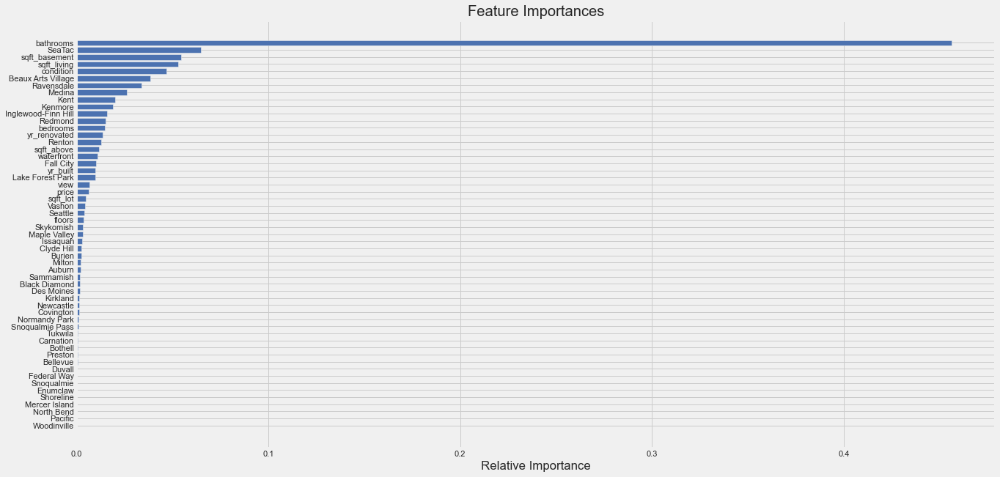

In [79]:
importances = model.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(20,10))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

In [80]:
y_pred = rf_random.predict(X_test)

<AxesSubplot:xlabel='price', ylabel='Count'>

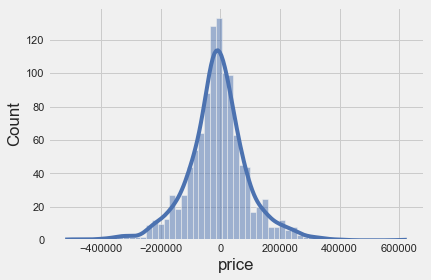

In [81]:
sns.histplot(y_test - y_pred,kde = True)

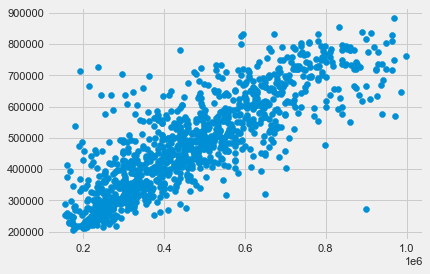

In [82]:
plt.scatter(y_test,y_pred) 

In [83]:
from sklearn.model_selection import learning_curve

[ 208  416  624  833 1041 1249 1458 1666 1874 2083]


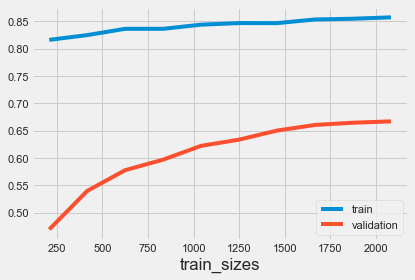

In [84]:
N, train_score, val_score = learning_curve(model, X_train, y_train,
                                           train_sizes=np.linspace(0.1, 1, 10), cv=5)

print(N)
plt.plot(N, train_score.mean(axis=1), label='train')
plt.plot(N, val_score.mean(axis=1), label='validation')
plt.xlabel('train_sizes')
plt.legend()

In [85]:
print('MAE is:',mean_absolute_error(y_test,y_pred))
print('MSE is:',mean_squared_error(y_test,y_pred))
print('RMSE is:',np.sqrt(mean_squared_error(y_test,y_pred)))
print('R2 SCORE is:',r2_score(y_test, y_pred))

MAE is: 74871.77236295727
MSE is: 11290301959.800156
RMSE is: 106255.83259191072
R2 SCORE is: 0.6825562358741382


In [86]:
param_grid = {
    'max_depth': [rf_random.best_params_['max_depth']],
    'max_features': [rf_random.best_params_['max_features']],
    'min_samples_leaf': [rf_random.best_params_['min_samples_leaf'], 
                         rf_random.best_params_['min_samples_leaf']+2],
    'min_samples_split': [rf_random.best_params_['min_samples_split'] - 2,
                          rf_random.best_params_['min_samples_split'] - 1,
                          rf_random.best_params_['min_samples_split'], 
                          rf_random.best_params_['min_samples_split'] +1,
                          rf_random.best_params_['min_samples_split'] + 2],
    'n_estimators': [rf_random.best_params_['n_estimators'] - 100, 
                     rf_random.best_params_['n_estimators'], 
                     rf_random.best_params_['n_estimators'] + 100]
}

print(param_grid)

{'max_depth': [20], 'max_features': ['auto'], 'min_samples_leaf': [1, 3], 'min_samples_split': [13, 14, 15, 16, 17], 'n_estimators': [600, 700, 800]}


In [87]:
rf=RandomForestRegressor()
grid_search=GridSearchCV(estimator=rf,param_grid=param_grid,cv=3,n_jobs=-1,verbose=2)
grid_search.fit(X_train,y_train)

Fitting 3 folds for each of 30 candidates, totalling 90 fits


GridSearchCV(cv=3, estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid={'max_depth': [20], 'max_features': ['auto'],
                         'min_samples_leaf': [1, 3],
                         'min_samples_split': [13, 14, 15, 16, 17],
                         'n_estimators': [600, 700, 800]},
             verbose=2)

In [88]:
grid_search

GridSearchCV(cv=3, estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid={'max_depth': [20], 'max_features': ['auto'],
                         'min_samples_leaf': [1, 3],
                         'min_samples_split': [13, 14, 15, 16, 17],
                         'n_estimators': [600, 700, 800]},
             verbose=2)

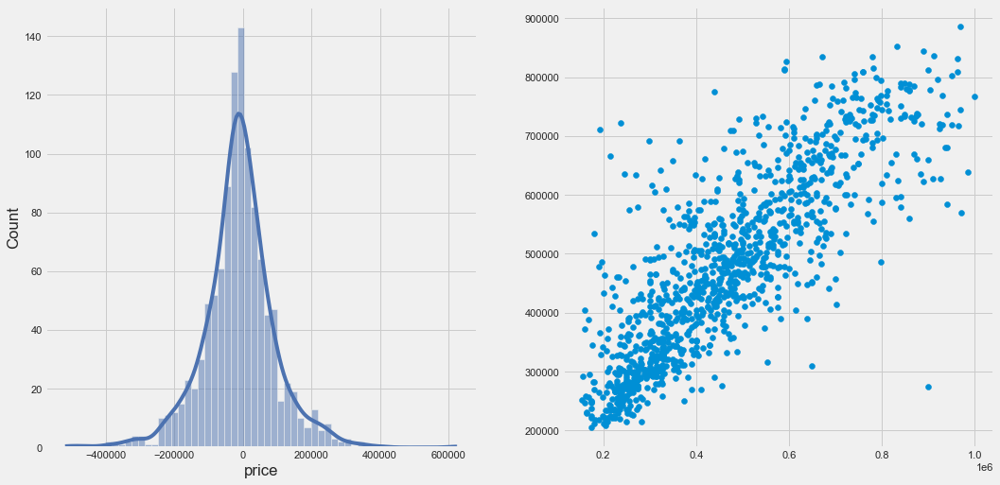

In [89]:
plt.figure(figsize=(16,8))
plt.subplot(1,2,1)
y_pred=grid_search.predict(X_test)
sns.histplot(y_test - y_pred, kde = True)
plt.subplot(1,2,2)
plt.scatter(y_test, y_pred)

In [90]:
print('MAE is:',mean_absolute_error(y_test,y_pred))
print('MSE is:',mean_squared_error(y_test,y_pred))
print('RMSE is:',np.sqrt(mean_squared_error(y_test,y_pred)))
print('R2 SCORE is:',r2_score(y_test, y_pred))

MAE is: 74913.1249312748
MSE is: 11251735270.469524
RMSE is: 106074.1970060086
R2 SCORE is: 0.6836405961573777


In [91]:
X = np.array([[3,1.5,1340,7912,1.5,0,0,3,1340,0,1955,2005,"18810 Densmore Ave N","Shoreline","WA 98133","USA"]])

In [92]:
X

array([['3', '1.5', '1340', '7912', '1.5', '0', '0', '3', '1340', '0',
        '1955', '2005', '18810 Densmore Ave N', 'Shoreline', 'WA 98133',
        'USA']], dtype='<U32')

In [93]:
l = [0]*len(df0.columns)
l = np.array(l)
l =l.reshape(1,l.shape[0])

In [94]:
X = X[0][:-2]

In [95]:
city = X[-1]

In [96]:
X = X[:-2]

In [97]:
zeros = [0]*43
zeros = np.array(zeros)
zeros = zeros.reshape(1,zeros.shape[0])
zeros

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]])

In [98]:
X =np.append(X,zeros)

In [99]:
d = { }
for count, col in enumerate(df0.columns[13:]):
    d[col] = count
print(d)

{'Auburn': 0, 'Beaux Arts Village': 1, 'Bellevue': 2, 'Black Diamond': 3, 'Bothell': 4, 'Burien': 5, 'Carnation': 6, 'Clyde Hill': 7, 'Covington': 8, 'Des Moines': 9, 'Duvall': 10, 'Enumclaw': 11, 'Fall City': 12, 'Federal Way': 13, 'Inglewood-Finn Hill': 14, 'Issaquah': 15, 'Kenmore': 16, 'Kent': 17, 'Kirkland': 18, 'Lake Forest Park': 19, 'Maple Valley': 20, 'Medina': 21, 'Mercer Island': 22, 'Milton': 23, 'Newcastle': 24, 'Normandy Park': 25, 'North Bend': 26, 'Pacific': 27, 'Preston': 28, 'Ravensdale': 29, 'Redmond': 30, 'Renton': 31, 'Sammamish': 32, 'SeaTac': 33, 'Seattle': 34, 'Shoreline': 35, 'Skykomish': 36, 'Snoqualmie': 37, 'Snoqualmie Pass': 38, 'Tukwila': 39, 'Vashon': 40, 'Woodinville': 41, 'Yarrow Point': 42}


In [152]:
d.keys()

dict_keys(['Auburn', 'Beaux Arts Village', 'Bellevue', 'Black Diamond', 'Bothell', 'Burien', 'Carnation', 'Clyde Hill', 'Covington', 'Des Moines', 'Duvall', 'Enumclaw', 'Fall City', 'Federal Way', 'Inglewood-Finn Hill', 'Issaquah', 'Kenmore', 'Kent', 'Kirkland', 'Lake Forest Park', 'Maple Valley', 'Medina', 'Mercer Island', 'Milton', 'Newcastle', 'Normandy Park', 'North Bend', 'Pacific', 'Preston', 'Ravensdale', 'Redmond', 'Renton', 'Sammamish', 'SeaTac', 'Seattle', 'Shoreline', 'Skykomish', 'Snoqualmie', 'Snoqualmie Pass', 'Tukwila', 'Vashon', 'Woodinville', 'Yarrow Point'])

In [160]:
d

{'Auburn': 0,
 'Beaux Arts Village': 1,
 'Bellevue': 2,
 'Black Diamond': 3,
 'Bothell': 4,
 'Burien': 5,
 'Carnation': 6,
 'Clyde Hill': 7,
 'Covington': 8,
 'Des Moines': 9,
 'Duvall': 10,
 'Enumclaw': 11,
 'Fall City': 12,
 'Federal Way': 13,
 'Inglewood-Finn Hill': 14,
 'Issaquah': 15,
 'Kenmore': 16,
 'Kent': 17,
 'Kirkland': 18,
 'Lake Forest Park': 19,
 'Maple Valley': 20,
 'Medina': 21,
 'Mercer Island': 22,
 'Milton': 23,
 'Newcastle': 24,
 'Normandy Park': 25,
 'North Bend': 26,
 'Pacific': 27,
 'Preston': 28,
 'Ravensdale': 29,
 'Redmond': 30,
 'Renton': 31,
 'Sammamish': 32,
 'SeaTac': 33,
 'Seattle': 34,
 'Shoreline': 35,
 'Skykomish': 36,
 'Snoqualmie': 37,
 'Snoqualmie Pass': 38,
 'Tukwila': 39,
 'Vashon': 40,
 'Woodinville': 41,
 'Yarrow Point': 42}

In [100]:
X[d[city]]=1

In [101]:
X

array(['3', '1.5', '1340', '7912', '1.5', '0', '0', '3', '1340', '0',
       '1955', '2005', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0',
       '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0',
       '1', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0',
       '0', '0', '0', '0', '0', '0', '0'], dtype='<U32')

In [102]:
X[:12]=scaler.transform([X[:12]])

In [103]:
X

array(['-0.33267482143218857', '-0.8486506408500587',
       '-0.8606362522510094', '-0.17838586846919932',
       '-0.010120130542429835', '-0.04237135986070358',
       '-0.2593791420104929', '-0.706057033960538', '-0.5305970888400979',
       '-0.643993722154373', '-0.5636749826231481', '1.2453324185116799',
       '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0',
       '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '1', '0', '0',
       '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0',
       '0', '0', '0', '0'], dtype='<U32')

In [104]:
len(X)

55

In [105]:
price = model.predict([X])
price[0]

240555.90950243306

In [117]:
df.columns

Index(['date', 'price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot',
       'floors', 'waterfront', 'view', 'condition', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'street', 'city',
       'statezip', 'country'],
      dtype='object')

In [156]:
def process_input(scaler,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,
                  sqft_above,sqft_basement,yr_built,yr_reno,street,city,statezip,country):
    X = np.array([[bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,sqft_above,sqft_basement,yr_built,yr_reno,street,city,statezip,country]])
    l = [0]*len(df0.columns)
    l = np.array(l)
    l =l.reshape(1,l.shape[0])
    X = X[0][:-2]
    city = X[-1]
    X = X[:-2]
    zeros = [0]*43
    zeros = np.array(zeros)
    zeros = zeros.reshape(1,zeros.shape[0])
    X =np.append(X,zeros)
    X[d[city]]=1
    X[:12]=scaler.transform([X[:12]])
    return [X]
    

In [157]:
process_input(scaler,3,1.5,1340,7912,1.5,0,0,3,1340,0,1955,2005,"18810 Densmore Ave N","Shoreline","WA 98133","USA")

[array(['-0.33267482143218857', '-0.8486506408500587',
        '-0.8606362522510094', '-0.17838586846919932',
        '-0.010120130542429835', '-0.04237135986070358',
        '-0.2593791420104929', '-0.706057033960538', '-0.5305970888400979',
        '-0.643993722154373', '-0.5636749826231481', '1.2453324185116799',
        '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0',
        '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '1', '0', '0',
        '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0', '0',
        '0', '0', '0', '0'], dtype='<U32')]

In [163]:
prediction = model.predict(process_input(scaler,3,1.5,1340,7912,1.5,0,0,3,1340,0,1955,2005,"18810 Densmore Ave N","Shoreline","WA 98133","USA"))
prediction[0]

240555.90950243306

In [106]:
import pickle

In [107]:
data = {"model": model, "scaler": scaler}
with open('saved_steps.pkl', 'wb') as file:
    pickle.dump(data, file)

In [108]:
with open('saved_steps.pkl', 'rb') as file:
    data = pickle.load(file)

new_model = data["model"]
new_sc = data["scaler"]

In [109]:
new_price = new_model.predict([X])[0]
new_price

240555.90950243306